In [1]:
import numpy as np              # Одномерные и многомерные массивы (array)
import pandas as pd             # Таблицы и временные ряды (dataframe, series)
import matplotlib.pyplot as plt # Научная графика
import seaborn as sns           # Еще больше красивой графики для визуализации данных
import sklearn                  # Алгоритмы машинного обучения

from sklearn.impute import SimpleImputer # заполнение пропущенных значений
from sklearn.preprocessing import StandardScaler # стандартизация признаков

TODO:

Разбить сразу на обучающую и тестовую выборки.
Использовать `sklearn.neighbors.LocalOutlierFactor`
для нахождения outliers.

# **Классификация жанров музыки**


## 1. Загружаем данные

Загружаем файл с диска:

([Исходный датасет](https://www.kaggle.com/datasets/vicsuperman/prediction-of-music-genre?resource=download))


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# загрузка датасета

import os
project_dir = '/content/drive/MyDrive/Colab Notebooks/'
url = os.path.join(project_dir, 'music_genre3.csv')
data_raw = pd.read_csv(url)
# пропущенные значения
data_raw = data_raw.replace('empty_field', np.nan)
data_raw = data_raw.replace('?', np.nan)
data_raw['duration_ms'] = data_raw['duration_ms'].replace(-1, np.nan)

# удаляем данные, которые нас не интересуют
to_drop = ['obtained_date', 'instance_id']
data_raw = data_raw.drop(to_drop, axis=1)
'''
Примечание:
Смысл признака obtained_date остался мне непонятен.
Поле имеет пять различных значений и малоинформативно.
'''

data_raw.shape

(50000, 16)

Таблица содержит данные о 50 тыс. музыкальных композиций в следующих 10 жанрах:

'Electronic', 'Anime', 'Jazz', 'Alternative', 'Country', 'Rap', 'Blues', 'Rock', 'Classical', 'Hip-Hop'.


### Список признаков:

- `artist_name` - Исполнитель
- `track_name` - Название копмозиции
- `popularity` - Рейтинг популярности
- `acousticness` - Насколько песня является акустической
- `danceability` - Танцевальность композиции
- `duration_ms` - Длительность (мс)
- `energy` - Энергичность песни
- `instrumentalness` - Вероятность того, что в треке нет вокала
- `key` - Тональность
- `liveness` - Вероятность того, что песня исполнялась вживую
- `loudness` - Громкость
- `mode` - Major / Minor
- `speechiness` - Содержание текста в песне
- `tempo` - Темп
- `valence` - Позитивность

- `music_genre` - жанр (необходимо предсказать)

Датасет, вероятно, был основан на данных Spotify (авторы явно не указывают источник), и все параметры трека (танцевальность, энергичность, акустичность и т.д.) вычислены алгоритмами Spotify, в подробности которых мы вдаваться не будем. Для нас это черный ящик, а наша задача - на основе переданных нам данных определить жанр композиции.


### Для начала, немного посмотрим, как выглядят наши данные


In [4]:
# Вот случайные шесть песен
data_raw.sample(6)

,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
10205,NaN,Rag Mop - Single Version,36.0,0.315000,0.719,171000.0,0.337,0.000000,C,0.114,-11.525,Major,0.0430,94.59899999999999,0.880,Jazz
2444,Bassnectar,Hot Right Now (Bassnectar Remix),30.0,0.047700,0.345,257829.0,0.911,0.001170,G,0.124,-5.668,Major,0.1540,175.00400000000002,0.148,Electronic
17298,Passion Pit,Constant Conversations,49.0,0.174000,0.560,235600.0,0.799,0.067900,F,0.304,-4.466,Minor,0.0675,69.972,0.304,Alternative
3362,Chase & Status,Know Your Name,42.0,0.000864,0.271,235520.0,0.853,0.015400,C#,0.326,-4.249,Major,0.0613,174.935,0.135,Electronic
5959,Falcom Sound Team jdk,Seize the Day (Tokyo Xanadu Opening Theme Song),11.0,0.005550,0.560,230898.0,0.980,0.000003,F,0.336,-4.897,Minor,0.0839,NaN,0.344,Anime
34607,Albert Castiglia,Hoodoo on Me,27.0,0.000934,0.473,NaN,0.729,0.560000,A,0.124,-8.626,Minor,0.0696,127.163,0.762,Blues


In [5]:
'''
Забавно, что у песни стоит тональность Фа мажор, хотя гармонии в композиции буквально сходят с ума
'''
data_raw[data_raw['track_name'] == 'Paranoid Android']

,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
39325,Radiohead,Paranoid Android,67.0,0.0377,0.252,387213.0,0.849,0.00592,F,0.0545,-6.501,Major,0.0581,163.704,0.194,Rock


In [6]:
'''
Песня на 14 минут... Это ошибка? Нет, это Pink Floyd!
'''
data_raw[data_raw['track_name'] == 'Shine On You Crazy Diamond (Pts. 1-5)']

,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
36577,Pink Floyd,Shine On You Crazy Diamond (Pts. 1-5),65.0,0.771,0.266,811077.0,0.294,0.697,G,0.107,-11.938,Minor,0.0291,137.941,0.0397,Rock


In [7]:
# категориальные признаки:
data_raw['artist_name'] = data_raw['artist_name'].astype('category')
data_raw['key'] = data_raw['key'].astype('category')
data_raw['mode'] = data_raw['mode'].astype('category')
data_raw['music_genre'] = data_raw['music_genre'].astype('category')

data_raw.describe(include=['category'])

,artist_name,key,mode,music_genre
count,47511,50000,50000,50000
unique,6862,12,2,10
top,Nobuo Uematsu,G,Major,Alternative
freq,429,5727,32099,5000


Классы сбалансированы

In [8]:
data_raw['music_genre'].value_counts()

,count
music_genre,
Alternative,5000
Anime,5000
Blues,5000
Classical,5000
Country,5000
Electronic,5000
Hip-Hop,5000
Jazz,5000
Rap,5000


In [9]:
# непрерывные признаки
data_raw['tempo'] = data_raw['tempo'].astype('float64')

data_raw.describe(include=['float64'])

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,50000.000000,50000.000000,50000.000000,4.506100e+04,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,45020.000000,50000.000000
mean,44.220420,0.306383,0.558241,2.455035e+05,0.599755,0.181601,0.193896,-9.133761,0.093586,119.952961,0.456264
std,15.542008,0.341340,0.178632,1.114333e+05,0.264559,0.325409,0.161637,6.162990,0.101373,30.641701,0.247119
min,0.000000,0.000000,0.059600,1.550900e+04,0.000792,0.000000,0.009670,-47.046000,0.022300,34.347000,0.000000
25%,34.000000,0.020000,0.442000,1.904670e+05,0.433000,0.000000,0.096900,-10.860000,0.036100,94.941500,0.257000
50%,45.000000,0.144000,0.568000,2.273600e+05,0.643000,0.000158,0.126000,-7.276500,0.048900,119.879000,0.448000
75%,56.000000,0.552000,0.687000,2.756800e+05,0.815000,0.155000,0.244000,-5.173000,0.098525,140.471250,0.648000
max,99.000000,0.996000,0.986000,4.830606e+06,0.999000,0.996000,1.000000,3.744000,0.942000,220.276000,0.992000


In [10]:
# дискретные признаки:
data_raw['popularity'] = data_raw['popularity'].astype('int64')

data_raw.describe(include=['int64'])

,popularity
count,50000.000000
mean,44.220420
std,15.542008
min,0.000000
25%,34.000000
50%,45.000000
75%,56.000000
max,99.000000


In [11]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   artist_name       47511 non-null  category
 1   track_name        50000 non-null  object  
 2   popularity        50000 non-null  int64   
 3   acousticness      50000 non-null  float64 
 4   danceability      50000 non-null  float64 
 5   duration_ms       45061 non-null  float64 
 6   energy            50000 non-null  float64 
 7   instrumentalness  50000 non-null  float64 
 8   key               50000 non-null  category
 9   liveness          50000 non-null  float64 
 10  loudness          50000 non-null  float64 
 11  mode              50000 non-null  category
 12  speechiness       50000 non-null  float64 
 13  tempo             45020 non-null  float64 
 14  valence           50000 non-null  float64 
 15  music_genre       50000 non-null  category
dtypes: category(4), float6

In [12]:
# Процент пропущенных значений

data_raw.isnull().mean() * 100

,0
artist_name,4.978
track_name,0.000
popularity,0.000
acousticness,0.000
danceability,0.000
duration_ms,9.878
energy,0.000
instrumentalness,0.000
key,0.000
liveness,0.000


## 2. Визуализация и анализ



Посмотрим на диаграммы рассеивания:

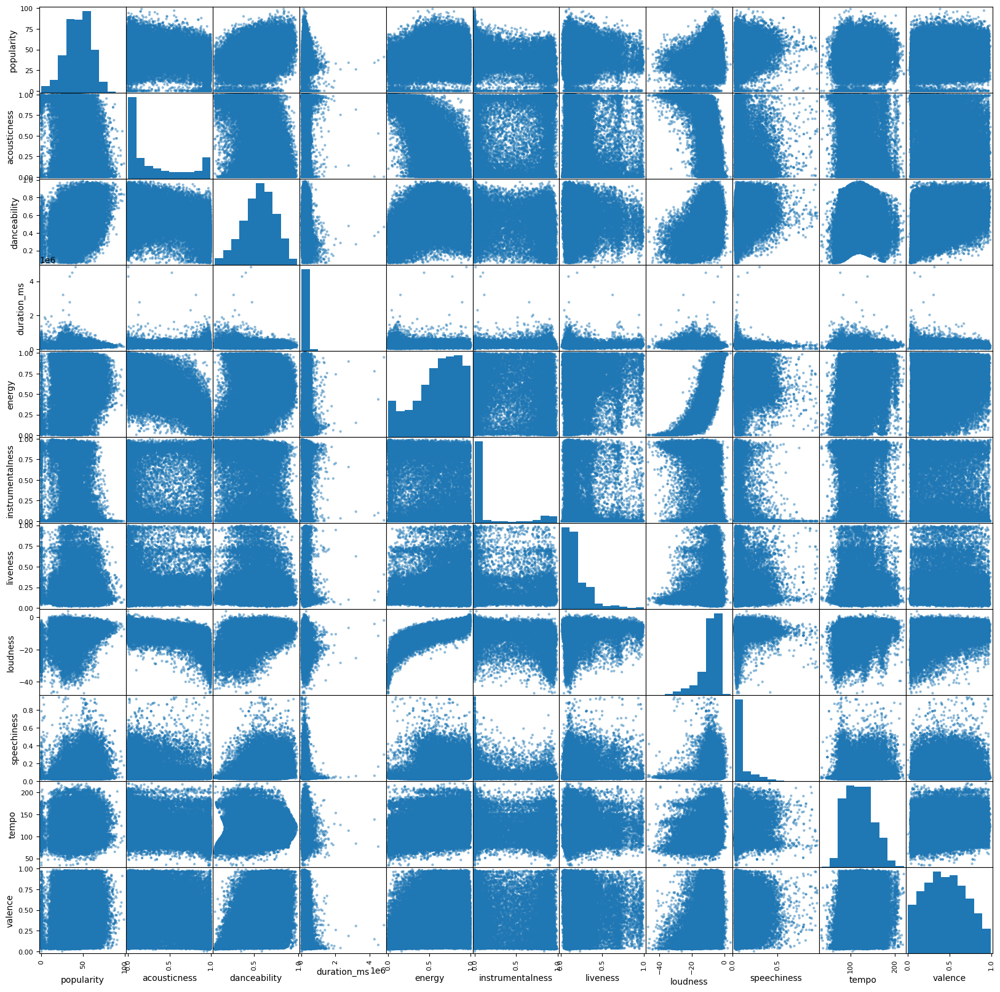

In [13]:
pd.plotting.scatter_matrix(data_raw, figsize = ( 20, 20))
pass

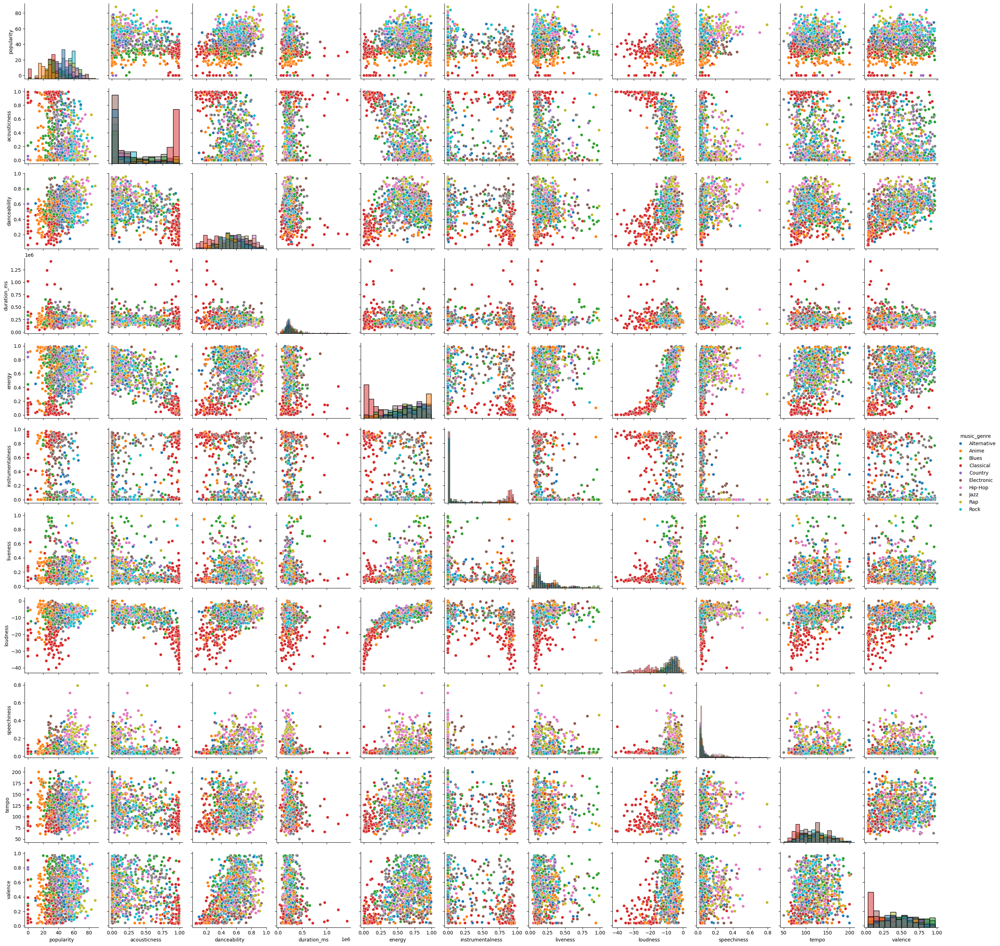

In [14]:
sns.pairplot(data_raw.sample(1000), hue='music_genre', diag_kind='hist')
pass

Не трудно заметить некоторые особенности признаков в нашем датасете:  
- Энергичность композиции растет пропорционально громкости (что в большинстве случаев соответствует интуитивному пониманию "энергичности")
- Акустические песни скорее будут иметь меньшую громкость (что вполне закономерно)


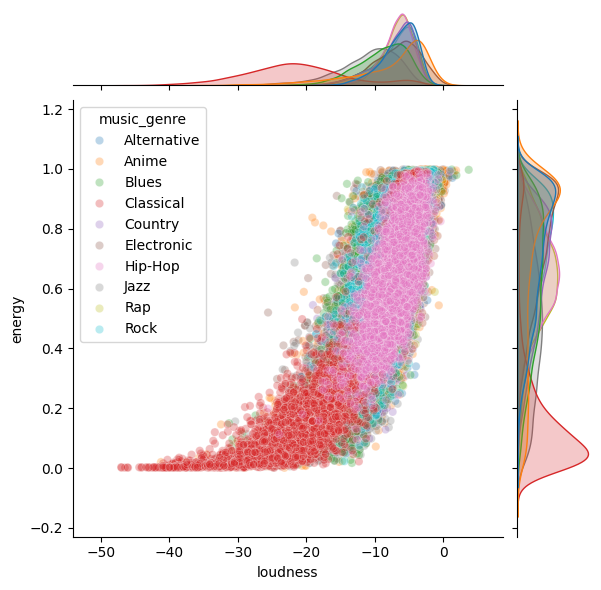

In [15]:
sns.jointplot(x='loudness', y='energy', alpha=.3, data=data_raw, hue='music_genre')
pass

Теперь попытаемся выяснить особенности жанров
- длинными чаще всего оказываются классические композиции
- больше всего слов в композициях жанров Hip-Hop и Rap
- инструментальными чаще оказываются классические и джазовые композиции, а также саундреки к аниме и электронная музыка

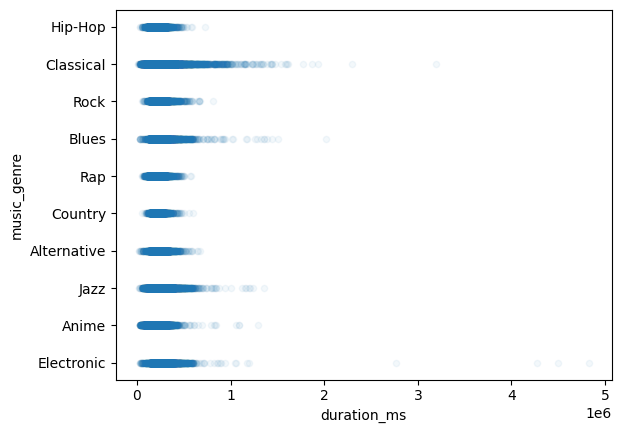

In [16]:
data_raw.plot(kind='scatter', x='duration_ms', y='music_genre', alpha=.05)
pass

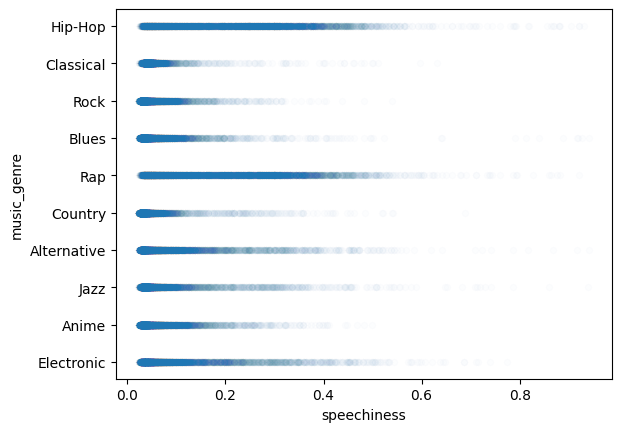

In [17]:
data_raw.plot(kind='scatter', x='speechiness', y='music_genre', alpha=.01)
pass

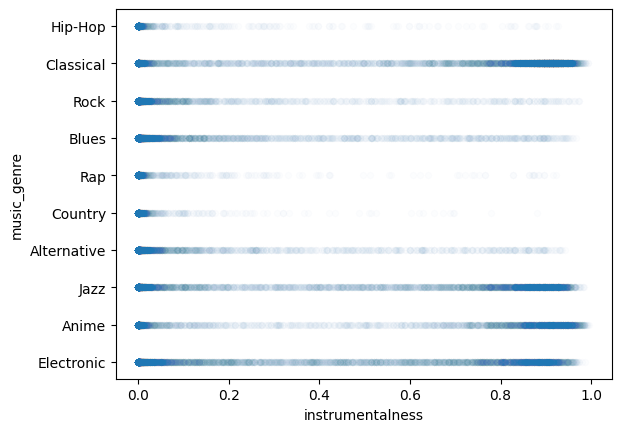

In [18]:
data_raw.plot(kind='scatter', x='instrumentalness', y='music_genre', alpha=.01)
pass

Большинство песен написаны в мажорной тональности

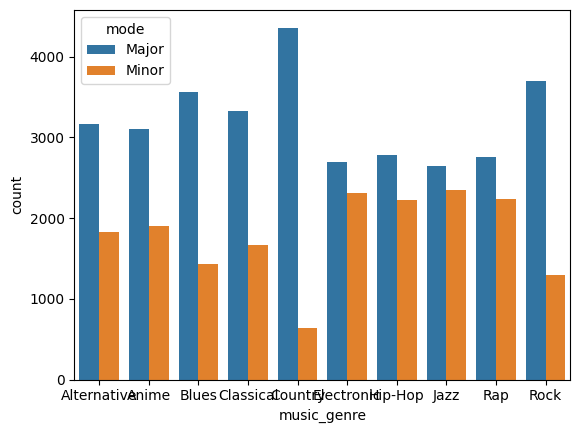

In [19]:
sns.countplot(x='music_genre', order=data_raw['music_genre'].value_counts().index, hue='mode', data=data_raw)
pass

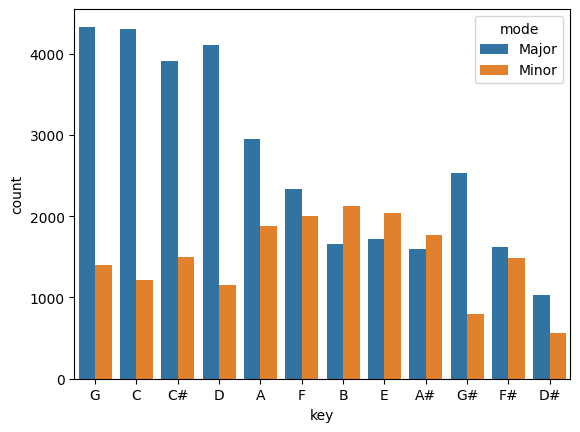

In [20]:
sns.countplot(x='key', order=data_raw['key'].value_counts().index, hue='mode', data=data_raw)
pass

In [21]:
data_raw[(data_raw['duration_ms'] > 800000) & (data_raw['music_genre'] == 'Rock')]

,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
36577,Pink Floyd,Shine On You Crazy Diamond (Pts. 1-5),65,0.771,0.266,811077.0,0.294,0.697,G,0.107,-11.938,Minor,0.0291,137.941,0.0397,Rock


Мы видим, что на диаграммах рассеивания длительность композиции `duration_ms` распределена сильно неравномерно. Подавляющее число композиций имеет небольшую длительность, но для некоторых композиций она принимает очень большие значения. Это выбросы, от которых стоит избавиться.

Для обнаружения выбросов найдем квантили для признака `duration_ms`:

In [22]:
data_raw['duration_ms'].quantile([0.005,.01,.05,.1,.5,.9,.95,.99,.995])

,duration_ms
0.005,60000.0
0.010,77600.0
0.050,129778.0
0.100,154907.0
0.500,227360.0
0.900,344080.0
0.950,412587.0
0.990,613894.6
0.995,778253.1


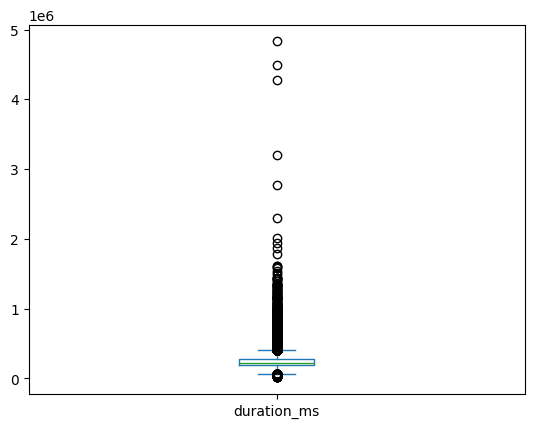

In [23]:
data_raw['duration_ms'].plot(kind='box')
pass

Мы видим, что:  
- 0.5% композиций имеют длительность меньше минуты (60000 мс)
- 0.5% композиций имеют длительность больше 12 минут (773099 мс)

Удалим все значения, выходящие за пределы квантилей 0.005 ,  0.995.

In [24]:
rows_to_drop = data_raw[
    (data_raw['duration_ms'] < data_raw['duration_ms'].quantile(0.005)) |
     (data_raw['duration_ms'] > data_raw['duration_ms'].quantile(0.995))].index
data = data_raw.drop(rows_to_drop)
data.shape

(49555, 16)

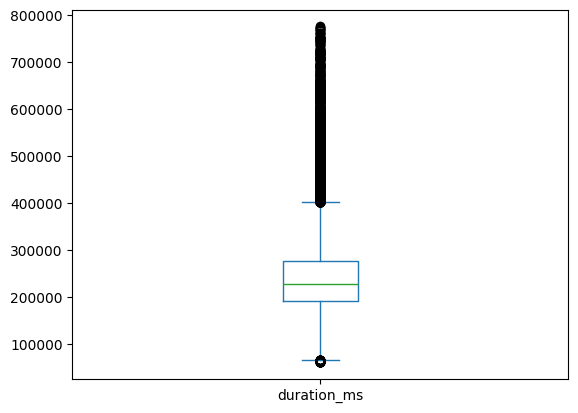

In [25]:
data['duration_ms'].plot(kind='box')
pass

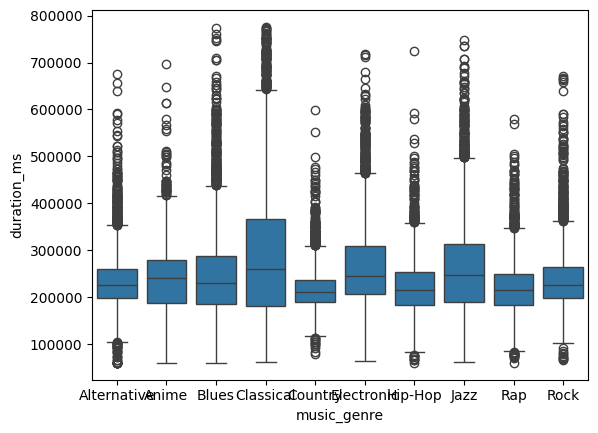

In [26]:
sns.boxplot(x='music_genre',y="duration_ms", data=data)
pass

Как мы видим, все еще присутствуют значительные выбросы по длительности.
Попробуем другой способ обнаружения выбросов. Можно воспользоваться эвристическим правилом, что все примеры за границами интервала $[Q_1-1.5\cdot{\rm IQR},\, Q_3+1.5\cdot{\rm IQR}]$ являются выбросами.

In [27]:
Q1, Q3 = data_raw['duration_ms'].quantile([.25, .75])
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

In [28]:
rows_to_drop = data_raw[
    (data_raw['duration_ms'] < lower) |
     (data_raw['duration_ms'] > upper)].index
data = data_raw.drop(rows_to_drop)
data.shape

(47306, 16)

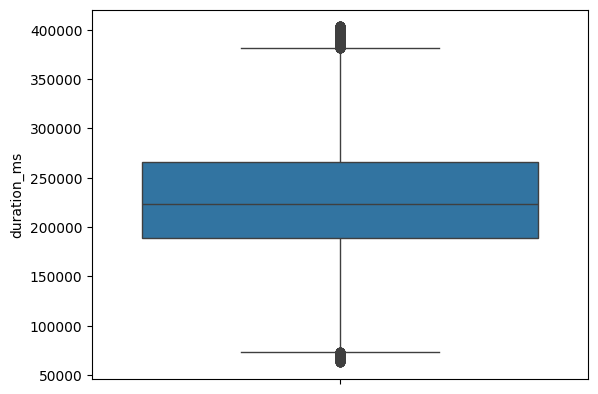

In [29]:
sns.boxplot(y="duration_ms", data=data)
pass

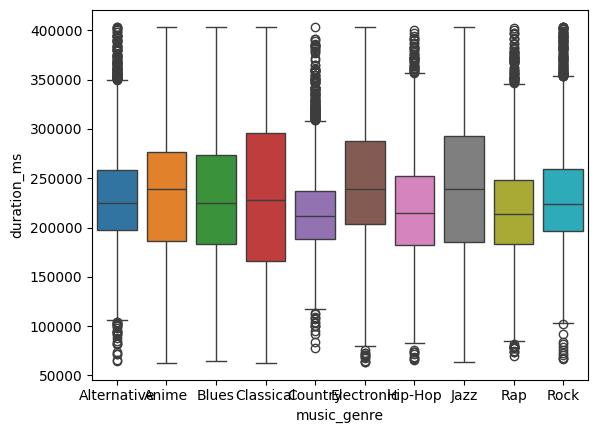

In [30]:
sns.boxplot(x='music_genre',y="duration_ms", hue="music_genre", data=data)
pass

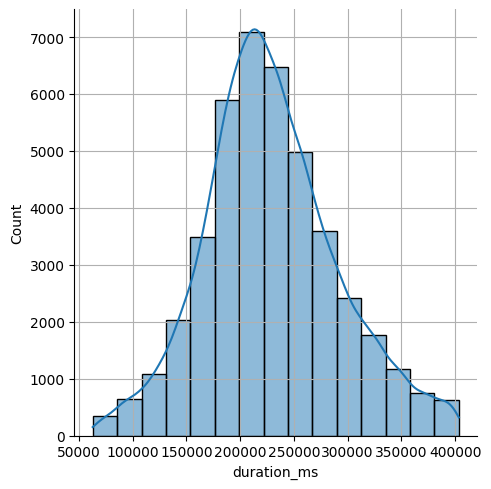

In [31]:
sns.displot(data['duration_ms'], bins=15, kde=True)
plt.grid()
pass

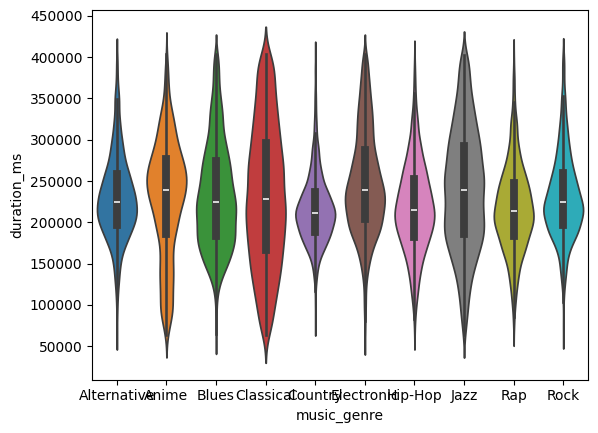

In [32]:
sns.violinplot(x="music_genre", y="duration_ms", hue='music_genre', data=data)
pass

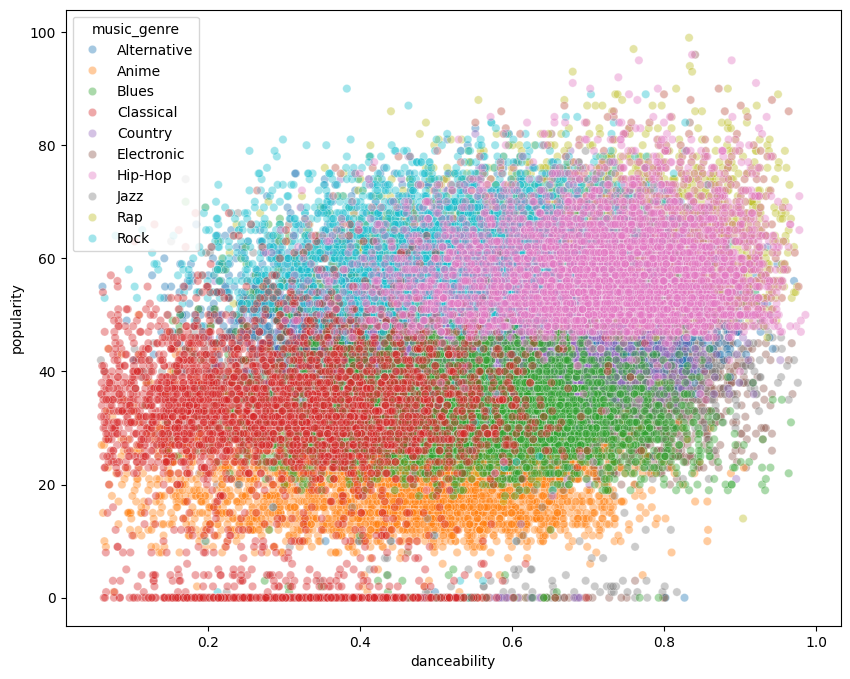

In [33]:
plt.figure(figsize = (10, 8))
sns.scatterplot(x='danceability', y='popularity', hue='music_genre', data=data, alpha=0.4)
pass

Можно вычислить матрицу корреляции для количественных признаков:

In [34]:
corr_mat = data.corr(numeric_only=True)
corr_mat

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
popularity,1.000000,-0.268706,0.341487,-0.040388,0.187883,-0.355249,-0.034212,0.294116,0.224350,0.021788,0.103304
acousticness,-0.268706,1.000000,-0.314198,-0.071471,-0.780399,0.367646,-0.108632,-0.718191,-0.159130,-0.221947,-0.243104
danceability,0.341487,-0.314198,1.000000,-0.092484,0.222774,-0.280502,-0.052511,0.355719,0.279087,-0.037007,0.410729
duration_ms,-0.040388,-0.071471,-0.092484,1.000000,0.062719,0.028226,0.021776,0.032122,-0.093975,-0.004389,-0.101848
energy,0.187883,-0.780399,0.222774,0.062719,1.000000,-0.368529,0.189114,0.830801,0.150022,0.253610,0.373790
instrumentalness,-0.355249,0.367646,-0.280502,0.028226,-0.368529,1.000000,-0.092111,-0.514797,-0.188448,-0.117728,-0.249306
liveness,-0.034212,-0.108632,-0.052511,0.021776,0.189114,-0.092111,1.000000,0.128036,0.113656,0.038926,0.049328
loudness,0.294116,-0.718191,0.355719,0.032122,0.830801,-0.514797,0.128036,1.000000,0.161223,0.231159,0.312727
speechiness,0.224350,-0.159130,0.279087,-0.093975,0.150022,-0.188448,0.113656,0.161223,1.000000,0.067132,0.044844
tempo,0.021788,-0.221947,-0.037007,-0.004389,0.253610,-0.117728,0.038926,0.231159,0.067132,1.000000,0.092315


Удобно использовать визуальный образ этой матрицы. Чем светлее ячейка, тем больше по абсолютной величине коэффициент корреляции:

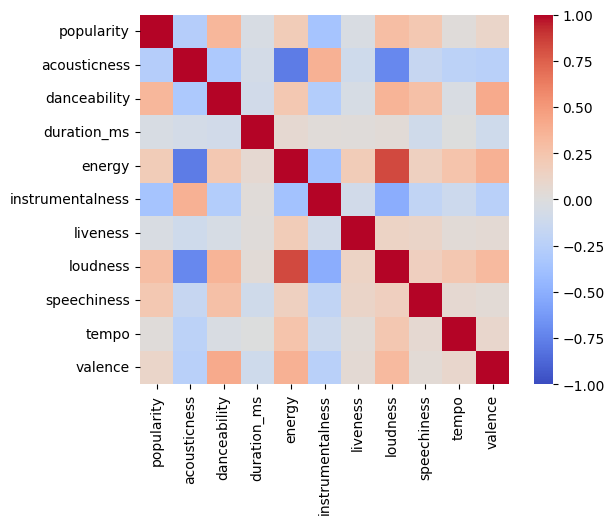

In [35]:
sns.heatmap(corr_mat, square=True, vmin=-1, vmax=1, cmap='coolwarm')
pass

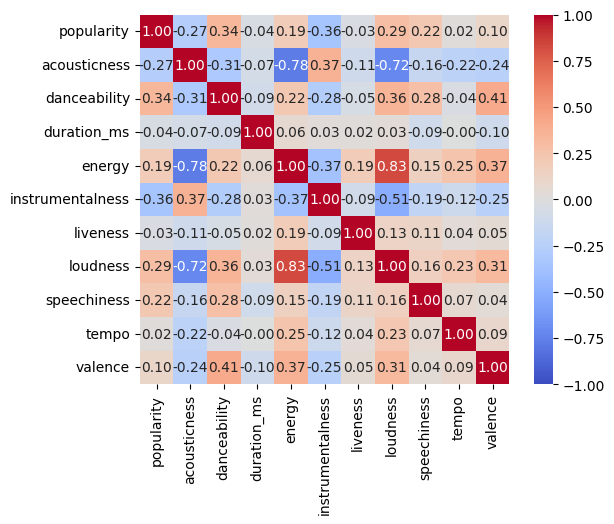

In [36]:
sns.heatmap(corr_mat, square=True, annot=True, fmt='.2f', vmin=-1, vmax=1, cmap='coolwarm')
pass

Выведем коэффициенты корреляции, большие заданного значения:

In [37]:
corr_mat > 0.5

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
popularity,True,False,False,False,False,False,False,False,False,False,False
acousticness,False,True,False,False,False,False,False,False,False,False,False
danceability,False,False,True,False,False,False,False,False,False,False,False
duration_ms,False,False,False,True,False,False,False,False,False,False,False
energy,False,False,False,False,True,False,False,True,False,False,False
instrumentalness,False,False,False,False,False,True,False,False,False,False,False
liveness,False,False,False,False,False,False,True,False,False,False,False
loudness,False,False,False,False,True,False,False,True,False,False,False
speechiness,False,False,False,False,False,False,False,False,True,False,False
tempo,False,False,False,False,False,False,False,False,False,True,False


In [38]:
corr_mat.where(np.triu(corr_mat > 0.5, k=1)).stack()

,,0
energy,loudness,0.830801


In [39]:
corr_mat.where(np.triu(np.abs(corr_mat) > 0.5, k=1)).stack().sort_values(ascending=False)

energy            loudness    0.830801
instrumentalness  loudness   -0.514797
acousticness      loudness   -0.718191
                  energy     -0.780399
dtype: float64

Корреляция этих признаков была нами замечена еще на диаграммах рассеивания. Энергичность песни возрастает вместе с громкостью, а в акустических песнях громкость (и, следовательно, энергичность) мала.

Интересно также, что мы не обнаружили явной корреляции популярности песни с какими-то признаками. Наибольший коэффициент корреляции между `popularity` и `danceability` (люди любят, когда под песню можно танцевать), а наибольший по модулю отрицательный - между `popularity` и `instrumentalness` (чисто инструментальные песни мало популярны).

##  3. Заполнение пропущенных значений

In [40]:
data_raw.isnull().mean() * 100

,0
artist_name,4.978
track_name,0.000
popularity,0.000
acousticness,0.000
danceability,0.000
duration_ms,9.878
energy,0.000
instrumentalness,0.000
key,0.000
liveness,0.000


Пропущенные значения в таблице представлены значениями `np.nan`. Избавиться от них можно двумя способами: можно просто удалить строки с пропущенными значениями, а можно заполнить пропущенные значения медианой или средним (для количественных признаков) или модой (для номинальных признаков).

Заменим числовые признаки медианой

In [41]:
ds = data_raw.drop(['artist_name', 'track_name'], axis=1)
imp_num = SimpleImputer(missing_values=np.nan, strategy='median')
imp_num.fit(ds[['duration_ms', 'tempo']])

SimpleImputer(strategy='median')

In [42]:
ds[['duration_ms', 'tempo']] = imp_num.transform(ds[['duration_ms', 'tempo']])
ds.isnull().mean() * 100

,0
popularity,0.0
acousticness,0.0
danceability,0.0
duration_ms,0.0
energy,0.0
instrumentalness,0.0
key,0.0
liveness,0.0
loudness,0.0
mode,0.0


## 4. Бинаризация номинальных признаков

Алгоритмы из библиотеки scikit-learn (почти) не умеют работать напрямую с категориальными признаками. Поэтому их вначале надо закодировать с помощью числовых принаков.

Бинарный признак `mode` заменим на числовой.

`'Major'` → 0, `'Minor'`→ 1

К категориальному (небинарному) признаку `key` применим метод *бинаризации* (*one-hot encoding*),
который заключается в следующем.

Этот признак принимает 12 значений - `'A'`, `'A#'`, `'B'`... - тоники тональности

Вместо признака `key` будем использовать 12 новых признаков (dummy-признаков, dummy - фиктивный), которые так и назовем `key_A`, `key_A#`, `key_B`, ...

При этом если признак `key` принимает значение `'A'`, то признак `key_A` равен 1, а все остальные 0, и т.д.

Аналогично поступим с `music_genre`

In [43]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(drop='if_binary', sparse_output=False)
enc.fit(ds[['mode', 'key']])

OneHotEncoder(drop='if_binary', sparse_output=False)

In [44]:
dummies = pd.DataFrame(enc.transform(ds[['mode', 'key']]),
                       columns=enc.get_feature_names_out(), index=ds.index)
dummies.head()

,mode_Minor,key_A,key_A#,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


Добавим эти dummy-столбцы к таблице и удалим столбцы `mode`, `key`:

In [45]:
ds = pd.concat((ds, dummies), axis=1).drop(['mode', 'key'], axis=1)

In [46]:
ds.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,...,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#
0,27,0.00468,0.652,227360.0,0.941,0.79200,0.115,-5.201,0.0748,100.889,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,31,0.01270,0.622,218293.0,0.890,0.95000,0.124,-7.043,0.0300,115.002,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,28,0.00306,0.620,215613.0,0.755,0.01180,0.534,-4.617,0.0345,127.994,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,34,0.02540,0.774,166875.0,0.700,0.00253,0.157,-4.498,0.2390,128.014,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,32,0.00465,0.638,222369.0,0.587,0.90900,0.157,-6.266,0.0413,145.036,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


## 5. Обучающая и тестовая выборки


In [47]:
X = ds.drop(['music_genre'], axis=1)
Y = ds['music_genre']

Разобьем данные на обучающую и тестовую выборки в пропорции 3:1 (75% - обучающая выборка, 25% - тестовая):

In [48]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.25, random_state = 42)

N_train, d = X_train.shape
N_test,  d = X_test.shape

N_train, N_test, d

(37500, 12500, 24)

## 6. Масштабирование количественных признаков

Перед применением алгоритмов машинного обучения количественные признаки полезно нормализовать.

Наиболее часто используют один из трех следующих способов:
- *приведение к отрезку $[0,1]$* - это линейное преобразование, приводящее все значения к заданному отрезку;
- *стандартизация* - линейное преобразование, приводящее все значения к нулевому среднему и единичному стандартному отклонению;
- *нормализация* - приведение данных к единичной норме.

Выполним стандартизацию всех признаков:

In [49]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns, index=X_train.index)

scaler = StandardScaler()
scaler.fit(X_test)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index=X_test.index)

In [50]:
X_train.describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,...,key_B,key_C,key_C#,key_D,key_D#,key_E,key_F,key_F#,key_G,key_G#
count,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,...,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04,3.750000e+04
mean,-7.844392e-17,3.259023e-17,-4.399681e-16,5.930663e-17,2.652693e-17,8.715991e-17,2.152471e-16,-6.214880e-17,-6.044350e-17,7.044794e-16,...,3.903248e-17,2.766380e-17,8.526513e-18,-3.903248e-17,-3.789561e-17,-3.031649e-18,-2.330580e-17,-2.880067e-17,-4.926430e-17,-2.046363e-17
std,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,...,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00
min,-2.857212e+00,-8.953570e-01,-2.782898e+00,-2.257942e+00,-2.267635e+00,-5.593516e-01,-1.138247e+00,-6.156240e+00,-7.035848e-01,-2.948428e+00,...,-2.866311e-01,-3.547614e-01,-3.477674e-01,-3.429307e-01,-1.804047e-01,-2.841176e-01,-3.046058e-01,-2.579197e-01,-3.606893e-01,-2.652512e-01
25%,-6.627632e-01,-8.378953e-01,-6.483001e-01,-4.835939e-01,-6.281343e-01,-5.593516e-01,-6.008544e-01,-2.822276e-01,-5.665353e-01,-8.011832e-01,...,-2.866311e-01,-3.547614e-01,-3.477674e-01,-3.429307e-01,-1.804047e-01,-2.841176e-01,-3.046058e-01,-2.579197e-01,-3.606893e-01,-2.652512e-01
50%,4.720561e-02,-4.761211e-01,5.504539e-02,-1.605811e-01,1.666225e-01,-5.588510e-01,-4.154192e-01,3.014670e-01,-4.404099e-01,2.259124e-03,...,-2.866311e-01,-3.547614e-01,-3.477674e-01,-3.429307e-01,-1.804047e-01,-2.841176e-01,-3.046058e-01,-2.579197e-01,-3.606893e-01,-2.652512e-01
75%,7.571744e-01,7.112254e-01,7.248982e-01,2.511421e-01,8.137817e-01,-7.415548e-02,3.115360e-01,6.428656e-01,4.919479e-02,6.628622e-01,...,-2.866311e-01,-3.547614e-01,-3.477674e-01,-3.429307e-01,-1.804047e-01,-2.841176e-01,-3.046058e-01,-2.579197e-01,-3.606893e-01,-2.652512e-01
max,3.532507e+00,2.024636e+00,2.388366e+00,2.922391e+01,1.510140e+00,2.499226e+00,4.962817e+00,2.091891e+00,8.430075e+00,3.465760e+00,...,3.488805e+00,2.818796e+00,2.875485e+00,2.916041e+00,5.543094e+00,3.519670e+00,3.282931e+00,3.877176e+00,2.772470e+00,3.770011e+00


In [51]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37500 entries, 27434 to 15795
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   popularity        37500 non-null  float64
 1   acousticness      37500 non-null  float64
 2   danceability      37500 non-null  float64
 3   duration_ms       37500 non-null  float64
 4   energy            37500 non-null  float64
 5   instrumentalness  37500 non-null  float64
 6   liveness          37500 non-null  float64
 7   loudness          37500 non-null  float64
 8   speechiness       37500 non-null  float64
 9   tempo             37500 non-null  float64
 10  valence           37500 non-null  float64
 11  mode_Minor        37500 non-null  float64
 12  key_A             37500 non-null  float64
 13  key_A#            37500 non-null  float64
 14  key_B             37500 non-null  float64
 15  key_C             37500 non-null  float64
 16  key_C#            37500 non-null  float64

# 7. Обучаем модель

In [52]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

## k-Nearest Neighbourhood model


### n_neighbors = 7

In [53]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=7, p=1)
model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=7, p=1)

In [54]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

Посмотрим на матрицу рассогласования:
- Чаще всего модель путает `Hip-Hop` и `Rap`, а также принимает `Rock` за `Alternative`. Это и не удивительно: границы между этими жанрами достаточно размыты
- А вот почему так часто модель путает `Rock` и `Alternative` с жанром `Country` понять достаточно сложно
- Больше всего модель уверена в `Classical`. Не удивительно: этот жанр сильно отличается от всех других

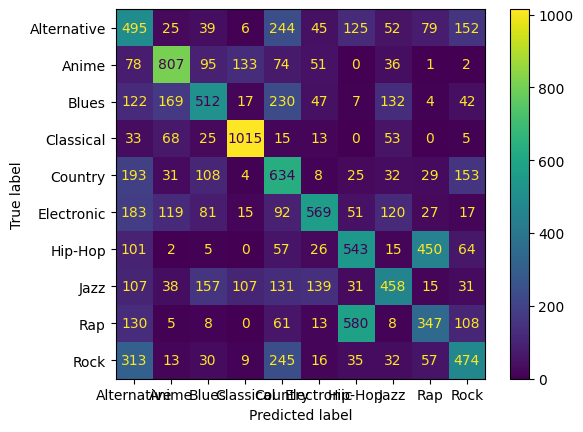

In [55]:
classes = list(pd.Categorical(data_raw['music_genre']).categories)

cm = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot()

In [56]:
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

 Alternative       0.28      0.39      0.33      1262
       Anime       0.63      0.63      0.63      1277
       Blues       0.48      0.40      0.44      1282
   Classical       0.78      0.83      0.80      1227
     Country       0.36      0.52      0.42      1217
  Electronic       0.61      0.45      0.52      1274
     Hip-Hop       0.39      0.43      0.41      1263
        Jazz       0.49      0.38      0.43      1214
         Rap       0.34      0.28      0.31      1260
        Rock       0.45      0.39      0.42      1224

    accuracy                           0.47     12500
   macro avg       0.48      0.47      0.47     12500
weighted avg       0.48      0.47      0.47     12500



### n_neighbors = 5

In [57]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=5, p=1)
model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

 Alternative       0.26      0.37      0.31      1262
       Anime       0.62      0.63      0.62      1277
       Blues       0.46      0.40      0.43      1282
   Classical       0.78      0.81      0.79      1227
     Country       0.37      0.52      0.43      1217
  Electronic       0.61      0.43      0.50      1274
     Hip-Hop       0.37      0.41      0.39      1263
        Jazz       0.48      0.37      0.42      1214
         Rap       0.33      0.27      0.30      1260
        Rock       0.43      0.36      0.39      1224

    accuracy                           0.46     12500
   macro avg       0.47      0.46      0.46     12500
weighted avg       0.47      0.46      0.46     12500



### n_neighbors = 9

In [58]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=9, p=1)
model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

 Alternative       0.29      0.37      0.32      1262
       Anime       0.65      0.62      0.63      1277
       Blues       0.50      0.40      0.44      1282
   Classical       0.76      0.83      0.80      1227
     Country       0.36      0.54      0.43      1217
  Electronic       0.63      0.45      0.52      1274
     Hip-Hop       0.38      0.43      0.40      1263
        Jazz       0.49      0.39      0.43      1214
         Rap       0.35      0.28      0.31      1260
        Rock       0.45      0.41      0.43      1224

    accuracy                           0.47     12500
   macro avg       0.49      0.47      0.47     12500
weighted avg       0.49      0.47      0.47     12500



## SVC

In [59]:
svc = SVC(random_state=42)
svc.fit(X_train, y_train)
y_train_pred = svc.predict(X_train)
y_test_pred = svc.predict(X_test)

print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

 Alternative       0.42      0.36      0.39      1262
       Anime       0.73      0.68      0.70      1277
       Blues       0.61      0.53      0.57      1282
   Classical       0.81      0.84      0.82      1227
     Country       0.50      0.55      0.52      1217
  Electronic       0.64      0.58      0.61      1274
     Hip-Hop       0.45      0.55      0.49      1263
        Jazz       0.52      0.51      0.51      1214
         Rap       0.44      0.34      0.38      1260
        Rock       0.50      0.68      0.58      1224

    accuracy                           0.56     12500
   macro avg       0.56      0.56      0.56     12500
weighted avg       0.56      0.56      0.56     12500



## MLP

In [60]:
model = MLPClassifier(hidden_layer_sizes = (30,), random_state = 42)
model.fit(X_train, y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print(classification_report(y_test, y_test_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


              precision    recall  f1-score   support

 Alternative       0.45      0.38      0.41      1262
       Anime       0.77      0.69      0.72      1277
       Blues       0.61      0.53      0.57      1282
   Classical       0.83      0.84      0.83      1227
     Country       0.53      0.57      0.55      1217
  Electronic       0.63      0.64      0.64      1274
     Hip-Hop       0.48      0.47      0.47      1263
        Jazz       0.54      0.50      0.52      1214
         Rap       0.45      0.48      0.46      1260
        Rock       0.52      0.71      0.60      1224

    accuracy                           0.58     12500
   macro avg       0.58      0.58      0.58     12500
weighted avg       0.58      0.58      0.58     12500



## Logistic regression

In [61]:
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

 Alternative       0.39      0.31      0.35      1262
       Anime       0.61      0.60      0.61      1277
       Blues       0.52      0.48      0.50      1282
   Classical       0.77      0.80      0.79      1227
     Country       0.44      0.58      0.50      1217
  Electronic       0.59      0.59      0.59      1274
     Hip-Hop       0.47      0.49      0.48      1263
        Jazz       0.47      0.41      0.44      1214
         Rap       0.46      0.38      0.41      1260
        Rock       0.51      0.65      0.57      1224

    accuracy                           0.53     12500
   macro avg       0.52      0.53      0.52     12500
weighted avg       0.52      0.53      0.52     12500



#8. Кластеризация

Решим ту же самую задачу как задачу кластеризации

In [62]:
from sklearn import cluster
from sklearn import metrics
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler

In [63]:
X = np.asarray(X_train)
y = np.asarray(pd.factorize(y_train)[0])
colors = np.array(['blue', 'red', 'green', 'magenta', 'yellow',
                   'cyan', 'gray', 'navy', 'tab:brown', 'tab:olive'])

In [64]:
def get_cmap(n, name='hsv'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)

cmap = get_cmap(10)


#colors = np.array(['blue', 'red', 'green', 'magenta', 'yellow',
#                  'cyan', 'gray', 'navy', 'tab:brown', 'tab:olive'])


<ipython-input-64-e0af3c5a3582>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  return plt.cm.get_cmap(name, n)


In [65]:
from scipy.optimize import linprog

def best_perm(A):
    n, n = A.shape
    res = linprog(-A.ravel(),
                  A_eq=np.r_[np.kron(np.identity(n), np.ones((1, n))),
                             np.kron(np.ones((1, n)), np.identity(n))],
                  b_eq=np.ones((2*n,)), bounds=n*n*[(0, None)])
    assert res.success
    return res.x.reshape(n, n).T

def perm(cm):

    df = pd.DataFrame(cm)
    shuffle = best_perm(df.values)

    bb = df.values @ shuffle
    bb = bb.astype(dtype=int)

    return bb

### KMeans

In [66]:
kmeans = cluster.MiniBatchKMeans(n_clusters = 10)
kmeans.fit(X)
y_pred = kmeans.predict(X_train)
pred = np.asarray(pd.factorize(y_pred)[0])

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(


Сравним визуально получившиеся распределение по кластерам с разчеменными в датасете данными. Цветами обозначаются разные классы. Так как пространство признаков у нас многомерное, посмотрим лишь на некоторые проекции.

В проекции на (`popularity`, `danceability`):

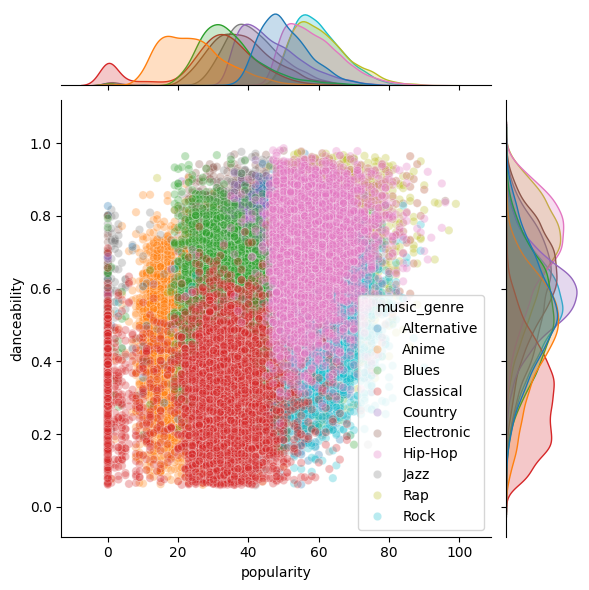

In [67]:
sns.jointplot(x='popularity', y='danceability', alpha=.3, data=data_raw, hue='music_genre')

Text(0.5, 1.0, 'true labels')

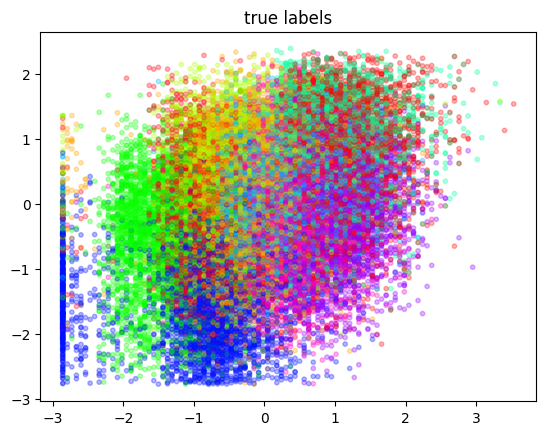

In [68]:
plt.scatter(X[:, 0], X[:, 2], color = cmap(y), s = 10, alpha = 0.3)
plt.title('true labels')

Text(0.5, 1.0, 'predicted labels')

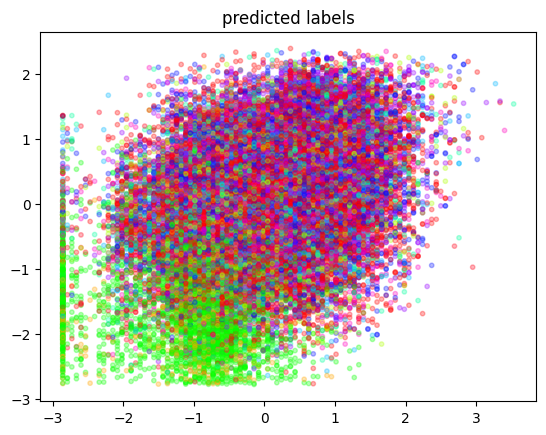

In [69]:
plt.scatter(X[:, 0], X[:, 2], color = cmap(pred), s = 10, alpha = 0.3)
plt.title('predicted labels')

Один кластер явно прослеживается - это жанр классической музыки. Мы уже видели раньше, что этот жанр достаточно сильно отличается от остальных, поэтому хорошо отслеживается различными методами
Остальные кластера визуально не прослеживаются

Рассмотрим проекцию на `loudness`, `energy`

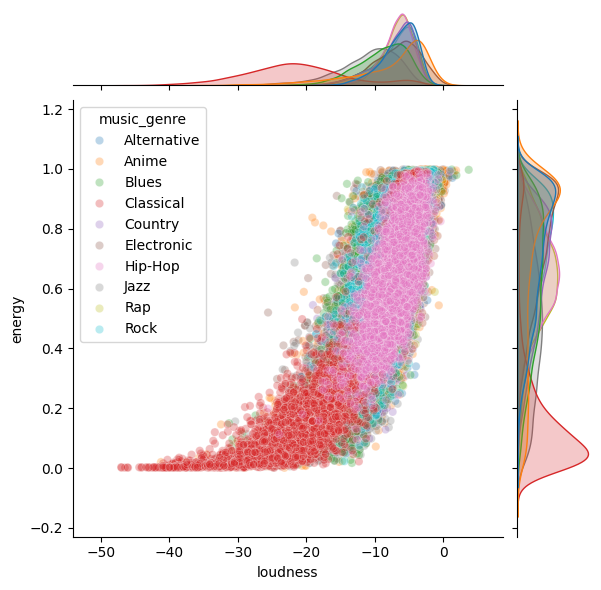

In [70]:
sns.jointplot(x='loudness', y='energy', alpha=.3, data=data_raw, hue='music_genre')

Text(0.5, 1.0, 'true labels')

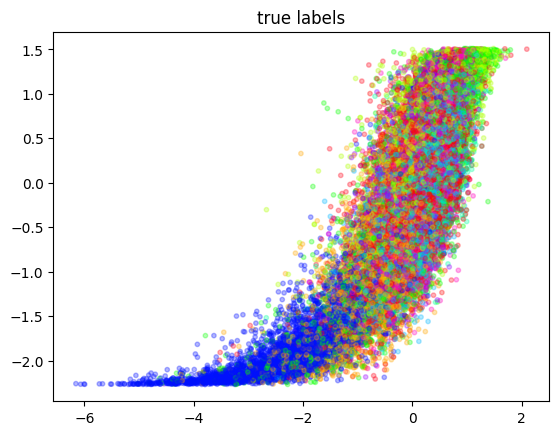

In [71]:
plt.scatter(X[:, 7], X[:, 4], color = cmap(y), s = 10, alpha = 0.3)
plt.title('true labels')

Text(0.5, 1.0, 'predicted labels')

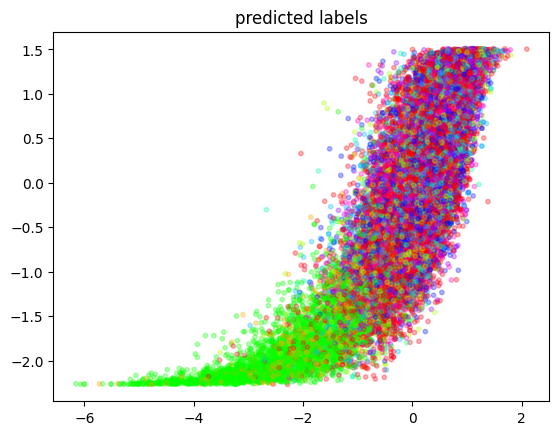

In [72]:
plt.scatter(X[:, 7], X[:, 4], color = cmap(pred), s = 10, alpha = 0.3)
plt.title('predicted labels')

Ситуация аналогичная: кластер классической музыки хорошо виден визуально, других кластеров не наблюдается

Если посмотреть на матрицу рассогласования, окажется, что только классическая музыка определяется верно, остальные классы верно не определяются. Можно сделать вывод, что данный алгоритм кластеризации не подходит для решение поставленной задачи классификации (выделенные кластеры не корреллируют с интересующими нас классами)

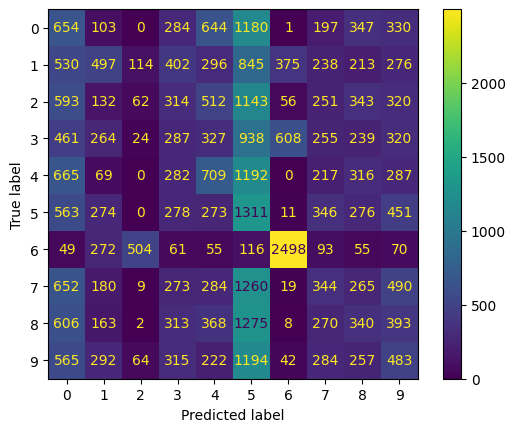

In [73]:
cm = perm(confusion_matrix(y, pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

### DBSCAN

In [74]:
dbscan = cluster.DBSCAN(eps = .2)
dbscan.fit(X)

labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 0
Estimated number of noise points: 37500


In [75]:
dbscan = cluster.DBSCAN(eps = .2)
dbscan.fit(X[:, 6:7])

labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 1
Estimated number of noise points: 0


`DBSCAN` не позволяет выявить кластеры на данном наборе данных

### AffinityPropagation

In [76]:
affinity_propagation = cluster.AffinityPropagation(preference=-50, random_state=42).fit(X[:1000, :])

cluster_centers_indices = affinity_propagation.cluster_centers_indices_
labels = affinity_propagation.labels_

n_clusters_ = len(cluster_centers_indices)

print("Estimated number of clusters: %d" % n_clusters_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(y[:1000], labels))
print("Completeness: %0.3f" % metrics.completeness_score(y[:1000], labels))
print("V-measure: %0.3f" % metrics.v_measure_score(y[:1000], labels))
print("Adjusted Rand Index: %0.3f" % metrics.adjusted_rand_score(y[:1000], labels))
print(
    "Adjusted Mutual Information: %0.3f"
    % metrics.adjusted_mutual_info_score(y[:1000], labels)
)
print(
    "Silhouette Coefficient: %0.3f"
    % metrics.silhouette_score(X[:1000, :], labels, metric="sqeuclidean")
)

Estimated number of clusters: 61
Homogeneity: 0.253
Completeness: 0.148
V-measure: 0.186
Adjusted Rand Index: 0.019
Adjusted Mutual Information: 0.097
Silhouette Coefficient: 0.217


In [77]:
###